In [1]:
import pandas as pd 
import numpy as np
import re
import string

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

from sklearn.metrics import confusion_matrix

### Data Facts and Import 

In [2]:
df_train = pd.read_csv('Dataset/SentimentAnalysisofTweetsthroughAltmetrics/train.csv')
df_test = pd.read_csv('Dataset/SentimentAnalysisofTweetsthroughAltmetrics/test.csv')

In [3]:
df_train.columns = ["Text", "Label"]
df_test.columns = ["Text", "Label"]

In [4]:
# remove the neutural.
df_train= df_train[df_train['Label'] != 0]
df_test= df_test[df_test['Label'] != 0]

In [5]:
# 0 present -
# 1 present +

# df_train['Label'].replace(-1, 0 ,inplace=True)
# df_test['Label'].replace(-1, 0,inplace=True)

In [6]:
df_train.shape

(470, 2)

In [7]:
df_train.head()

,Text,Label
0,good acronym copper nanotubes Definitely,-1
2,GlycemicIndex diet restricted energy effective...,1
3,higher fibre intake partic cereal fibre reduce...,1
4,next life going research copper nanotubes CuNTs,-1
6,Bean rich diet produces equivalent weight loss...,1


In [8]:
df_test.head()

,Text,Label
0,Yeah paper ebirdf,1
2,platform Bioinformatics paper advanced access ...,1
4,Duan naturally award Best Science Acronym year,-1
5,Everything Chinese turns swear word think karma,-1
6,dear difficulties finding scientific abbreviat...,-1


In [9]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 470 entries, 0 to 730
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Text    470 non-null    object
 1   Label   470 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 11.0+ KB


In [10]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 201 entries, 0 to 313
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Text    201 non-null    object
 1   Label   201 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 4.7+ KB


In [11]:
df_train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Label,470.0,0.029787,1.000621,-1.0,-1.0,1.0,1.0,1.0


In [12]:
df_test.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Label,201.0,0.014925,1.002385,-1.0,-1.0,1.0,1.0,1.0


### Data Cleaning / EDA

In [13]:
# ### Checking Missing values in the Data Set and printing the Percentage for Missing Values for Each Columns ###

# count = df_train.isnull().sum().sort_values(ascending=False)
# percentage = ((df_train.isnull().sum()/len(df_train)*100)).sort_values(ascending=False)
# missing_data = pd.concat([count, percentage], axis=1,
# keys=['Count','Percentage'])

# print('Count and percentage of missing values for the columns:')

# missing_data

In [14]:
# ### Checking for the Distribution of Default ###
# import matplotlib.pyplot as plt
# %matplotlib inline
# print('Percentage for default\n')
# print(round(df_train.Is_Response.value_counts(normalize=True)*100,2))
# round(df_train.Is_Response.value_counts(normalize=True)*100,2).plot(kind='bar')
# plt.title('Percentage Distributions by review type')
# plt.show()

In [15]:
#Removing columns
#df_train.drop(columns = ['User_ID', 'Browser_Used', 'Device_Used'], inplace = True)

In [16]:
# #This function converts to lower-case, removes square bracket, removes numbers and punctuation
# def text_clean_1(text):
#     text = text.lower()
#     text = re.sub('\[.*?\]', '', text)
#     text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
#     text = re.sub('\w*\d\w*', '', text)
#     return text

# cleaned1 = lambda x: text_clean_1(x)

In [17]:
# # Apply first level cleaning

# # Let's take a look at the updated text
# df_train['cleaned_description'] = pd.DataFrame(df_train.Description.apply(cleaned1))
# df_train.head(10)

In [18]:
# # Apply a second round of cleaning
# def text_clean_2(text):
#     text = re.sub('[‘’“”…]', '', text)
#     text = re.sub('\n', '', text)
#     return text

# cleaned2 = lambda x: text_clean_2(x)

In [19]:
# # Let's take a look at the updated text
# df_train['cleaned_description_new'] = pd.DataFrame(df_train['cleaned_description'].apply(cleaned2))
# df_train.head(10)

### Spliting the data.

In [20]:
from sklearn.model_selection import train_test_split

# Independent_var = df_train.cleaned_description_new
# Dependent_var = df_train.Is_Response

# IV_train, IV_test, DV_train, DV_test = train_test_split(Independent_var, Dependent_var, test_size = 0.1, random_state = 225)

IV_train = df_train.Text
DV_train = df_train.Label
IV_test = df_test.Text
DV_test = df_test.Label

print('IV_train :', len(IV_train))
print('IV_test  :', len(IV_test))
print('DV_train :', len(DV_train))
print('DV_test  :', len(DV_test))

IV_train : 470
IV_test  : 201
DV_train : 470
DV_test  : 201


### Model training 

### Logistic Regression

In [21]:
#TF-IDF
# Convert x_train to vector

tfidf_vectorizer = TfidfVectorizer()
tfidf_train = tfidf_vectorizer.fit_transform(IV_train) 
tfidf_test = tfidf_vectorizer.transform(IV_test)

model=LogisticRegression()
model.fit(tfidf_train, DV_train)

LogisticRegression()

In [22]:
tfidf_vectorizer

TfidfVectorizer()

In [23]:
y_pred = model.predict(tfidf_test.todense())
y_prob = model.predict_proba(tfidf_test.todense())# [:, 1]

c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


In [24]:
y_prob

array([[0.45353657, 0.54646343],
       [0.31561633, 0.68438367],
       [0.73676329, 0.26323671],
       [0.45003932, 0.54996068],
       [0.88333974, 0.11666026],
       [0.14373418, 0.85626582],
       [0.320365  , 0.679635  ],
       [0.2613947 , 0.7386053 ],
       [0.86096358, 0.13903642],
       [0.87109201, 0.12890799],
       [0.17951721, 0.82048279],
       [0.29340654, 0.70659346],
       [0.42625906, 0.57374094],
       [0.87187832, 0.12812168],
       [0.27903955, 0.72096045],
       [0.5886459 , 0.4113541 ],
       [0.53565041, 0.46434959],
       [0.82022174, 0.17977826],
       [0.7579807 , 0.2420193 ],
       [0.60208667, 0.39791333],
       [0.78494706, 0.21505294],
       [0.24223796, 0.75776204],
       [0.40143877, 0.59856123],
       [0.3501597 , 0.6498403 ],
       [0.13795967, 0.86204033],
       [0.72045319, 0.27954681],
       [0.57239175, 0.42760825],
       [0.91905299, 0.08094701],
       [0.28070994, 0.71929006],
       [0.32791226, 0.67208774],
       [0.

In [25]:
y_pred

array([ 1,  1, -1,  1, -1,  1,  1,  1, -1, -1,  1,  1,  1, -1,  1, -1, -1,
       -1, -1, -1, -1,  1,  1,  1,  1, -1, -1, -1,  1,  1, -1,  1, -1,  1,
       -1,  1,  1, -1,  1, -1,  1,  1,  1,  1, -1,  1,  1,  1, -1, -1, -1,
       -1, -1,  1, -1,  1,  1, -1, -1,  1, -1,  1,  1, -1, -1,  1,  1,  1,
        1,  1, -1,  1,  1, -1,  1,  1, -1, -1, -1,  1,  1,  1,  1, -1,  1,
        1, -1, -1,  1, -1,  1, -1, -1, -1,  1,  1, -1, -1,  1, -1,  1,  1,
        1, -1,  1, -1,  1,  1, -1, -1,  1,  1, -1,  1, -1, -1,  1, -1,  1,
        1,  1,  1,  1, -1, -1, -1,  1, -1, -1, -1,  1,  1,  1,  1, -1, -1,
        1, -1, -1,  1,  1,  1,  1, -1, -1, -1, -1, -1, -1,  1, -1, -1,  1,
        1, -1,  1,  1, -1, -1, -1,  1, -1,  1, -1, -1, -1, -1,  1, -1, -1,
       -1,  1, -1,  1, -1,  1,  1, -1, -1,  1, -1, -1,  1,  1,  1, -1, -1,
       -1,  1,  1, -1, -1,  1,  1, -1, -1,  1,  1,  1,  1,  1],
      dtype=int64)

In [26]:
confusion_matrix(y_pred, DV_test)

array([[91,  6],
       [ 8, 96]], dtype=int64)

In [27]:
from sklearn.metrics import accuracy_score, precision_score, recall_score  , f1_score

print("Accuracy : ", accuracy_score(y_pred, DV_test))
print("Precision : ", precision_score(y_pred, DV_test, average = 'weighted'))
print("Recall : ", recall_score(y_pred, DV_test, average = 'weighted'))
print("F1 Score : ", recall_score(y_pred, DV_test, average = 'weighted'))

Accuracy :  0.9303482587064676
Precision :  0.9305670104616549
Recall :  0.9303482587064676
F1 Score :  0.9303482587064676


In [28]:
# y_score = model.fit(tfidf_train, DV_train)#.decision_function(IV_test)
# y_score

In [29]:
DV_test

0      1
2      1
4     -1
5     -1
6     -1
      ..
306    1
307    1
310    1
311    1
313    1
Name: Label, Length: 201, dtype: int64

In [30]:
y_pred

array([ 1,  1, -1,  1, -1,  1,  1,  1, -1, -1,  1,  1,  1, -1,  1, -1, -1,
       -1, -1, -1, -1,  1,  1,  1,  1, -1, -1, -1,  1,  1, -1,  1, -1,  1,
       -1,  1,  1, -1,  1, -1,  1,  1,  1,  1, -1,  1,  1,  1, -1, -1, -1,
       -1, -1,  1, -1,  1,  1, -1, -1,  1, -1,  1,  1, -1, -1,  1,  1,  1,
        1,  1, -1,  1,  1, -1,  1,  1, -1, -1, -1,  1,  1,  1,  1, -1,  1,
        1, -1, -1,  1, -1,  1, -1, -1, -1,  1,  1, -1, -1,  1, -1,  1,  1,
        1, -1,  1, -1,  1,  1, -1, -1,  1,  1, -1,  1, -1, -1,  1, -1,  1,
        1,  1,  1,  1, -1, -1, -1,  1, -1, -1, -1,  1,  1,  1,  1, -1, -1,
        1, -1, -1,  1,  1,  1,  1, -1, -1, -1, -1, -1, -1,  1, -1, -1,  1,
        1, -1,  1,  1, -1, -1, -1,  1, -1,  1, -1, -1, -1, -1,  1, -1, -1,
       -1,  1, -1,  1, -1,  1,  1, -1, -1,  1, -1, -1,  1,  1,  1, -1, -1,
       -1,  1,  1, -1, -1,  1,  1, -1, -1,  1,  1,  1,  1,  1],
      dtype=int64)

In [31]:
# from sklearn.datasets import fetch_openml
# from sklearn.model_selection import train_test_split
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.multiclass import OneVsRestClassifier
# from sklearn.metrics import precision_recall_curve, roc_curve
# from sklearn.preprocessing import label_binarize

# import matplotlib.pyplot as plt
# #%matplotlib inline

# mnist = fetch_openml("mnist_784")
# y = mnist.target
# y = y.astype(np.uint8)
# n_classes = len(set(y))

# #Y = label_binarize(mnist.target, classes=[*range(n_classes)])
# Y = label_binarize(y, classes=[0,1, 2, 3,4,5,6,7,8,9])

# X_train, X_test, y_train, y_test = train_test_split(mnist.data,
#                                                     Y,
#                                                     random_state = 42)

# clf = OneVsRestClassifier(RandomForestClassifier(n_estimators=50,
#                              max_depth=3,
#                              random_state=0))
# clf.fit(X_train, y_train)

# y_score = clf.predict_proba(X_test)




In [32]:
# y

In [33]:
# Y

In [34]:
# y_test[0]

In [35]:
# y_score[0]

In [36]:
# # precision recall curve
# precision = dict()
# recall = dict()
# for i in range(n_classes):
#     precision[i], recall[i], _ = precision_recall_curve(y_test[:, i],
#                                                         y_score[:, i])
#     plt.plot(recall[i], precision[i], lw=2, label='class {}'.format(i))
    
# plt.xlabel("recall")
# plt.ylabel("precision")
# plt.legend(loc="best")
# plt.title("precision vs. recall curve")
# plt.show()

2
0
1


c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


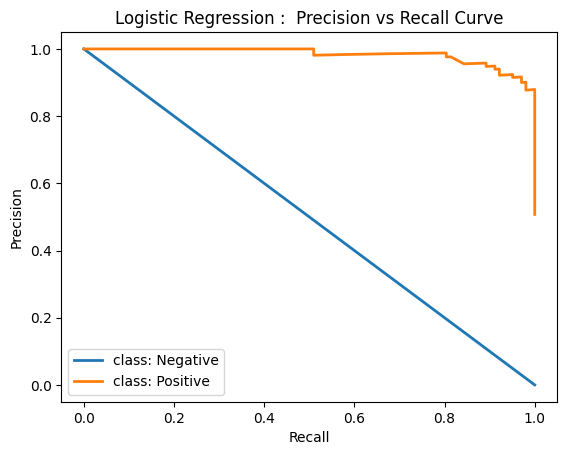

In [37]:
# precision recall curve

from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

#DV_test = DV_test.astype(np.uint8)
n_classes =len(set(DV_test))
DV_test_labelBinary = label_binarize(DV_test, classes=[0,1,2])

print(n_classes)
labels = ["Negative" , "Positive" , "Neutral"]
precision = dict()
recall = dict()
for i in range(n_classes):
    print(i)
    precision[i], recall[i], _ = precision_recall_curve(DV_test_labelBinary[:, i], y_prob[:, i])
    plt.plot(recall[i], precision[i], lw=2, label='class: {}'.format(labels[i]))
    
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc='lower left')
plt.title("Logistic Regression :  Precision vs Recall Curve")
plt.show()


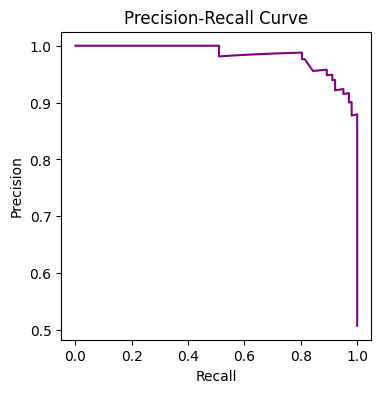

In [38]:
#calculate precision and recall
from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve

#DV_test = label_binarize(DV_test, classes=[0,1,2])

precision_logistic, recall_logistic, thresholds_logistic = precision_recall_curve(DV_test, y_prob[:, 1])

#create precision recall curve
fig, ax = plt.subplots(figsize=(4,4))
ax.plot(recall_logistic, precision_logistic, color='purple')


#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#display plot
plt.show()

In [39]:
idx =10
df_test.Label[idx]

1

In [40]:
df_test.head(20)

,Text,Label
0,Yeah paper ebirdf,1
2,platform Bioinformatics paper advanced access ...,1
4,Duan naturally award Best Science Acronym year,-1
5,Everything Chinese turns swear word think karma,-1
6,dear difficulties finding scientific abbreviat...,-1
8,week study obese patients High fibre carb heal...,1
9,Beyond hours Researchers argue deliberate prac...,1
10,good article interested natural alternatives t...,1
11,Single walled copper nanotubes Without doubt u...,-1
12,poor choice scientific acronym ever,-1


In [41]:
# Case 1 Correct: Actual Label = 1, Predicted Label = 1,  

#import lime
#import lime.lime_text
from lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

# from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=[-1,1])

# Explaining the predictions and important features for predicting the label 1
c = make_pipeline(tfidf_vectorizer, model)

idx = 10
exp = explainer.explain_instance(df_test.Text[idx], c.predict_proba, num_features=10)
print('Original Instance -> Text:', df_test.Text[idx], ', Label: ',  df_test.Label[idx])
exp.show_in_notebook(text=True)


Original Instance -> Text: good article interested natural alternatives treat ADHD , Label:  1


In [42]:
print(df_test.Text[10])

good article interested natural alternatives treat ADHD


In [43]:
# # Case 1 Correct: Actual Label = 1, Predicted Label = 1

# from lime_text import LimeTextExplainer
# from sklearn.pipeline import make_pipeline
# explainer = LimeTextExplainer(class_names=[-1,1])
# c = make_pipeline(tfidf_vectorizer, model)
# idx = 10
# print(df_test.Text[10] , " " , df_test.Label[10])
# exp = explainer.explain_instance(df_test.Text[idx], c.predict_proba, num_features=10)
# exp.show_in_notebook(text=True)

In [44]:
df_test.Text[4]

'Duan naturally award Best Science Acronym year'

In [45]:
# Case 2 Correct: Actual Label = -1, Predicted Label = -1

#import lime
#import lime.lime_text
from lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

# from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=[-1,1])

# Explaining the predictions and important features for predicting the label 1
c = make_pipeline(tfidf_vectorizer, model)

idx = 4
exp = explainer.explain_instance(df_test.Text[idx], c.predict_proba, num_features=10)
print('Original Instance -> Text:', df_test.Text[idx], ', Label: ',  df_test.Label[idx])
exp.show_in_notebook(text=True)


Original Instance -> Text: Duan naturally award Best Science Acronym year , Label:  -1


In [46]:
# Case 2 Correct: Actual Label = -1, Predicted Label = -1
from lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
explainer = LimeTextExplainer(class_names=[-1,1])
c = make_pipeline(tfidf_vectorizer, model)
idx = 4
print(df_test.Text[4] , " " , df_test.Label[4])
exp = explainer.explain_instance(df_test.Text[idx], c.predict_proba, num_features=10)
exp.show_in_notebook(text=True)

Duan naturally award Best Science Acronym year   -1


In [47]:
df_test.Text[5] , df_test.Label[5] 

('Everything Chinese turns swear word think karma', -1)

In [48]:
# Case 3 Wrong: Actual Label = -1, Predicted Label =-1,    

#import lime
#import lime.lime_text
from lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

# from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=[-1,1])

# Explaining the predictions and important features for predicting the label 1
c = make_pipeline(tfidf_vectorizer, model)

idx = 5
exp = explainer.explain_instance(df_test.Text[idx], c.predict_proba, num_features=10)
print('True class: %s' % df_test.Text[idx], df_test.Label[idx])
exp.show_in_notebook(text=True)


True class: Everything Chinese turns swear word think karma -1


### Support Vector Machine

In [49]:
from sklearn.svm import SVC
from sklearn import metrics

# tfidf_vectorizer = TfidfVectorizer()

# svc=SVC(probability=True) #Default hyperparameters

# model = Pipeline([('vectorizer',tfidf_vectorizer), ('classifier',svc)] )
# model.fit(IV_train, DV_train)
# predictions = model.predict(IV_test)

# # svc.fit(X_train,y_train)
# # y_pred=svc.predict(X_test)
# # print('Accuracy Score:')
# # print(metrics.accuracy_score(y_test,y_pred))

tfidf_vectorizer = TfidfVectorizer()
tfidf_train = tfidf_vectorizer.fit_transform(IV_train) 
tfidf_test = tfidf_vectorizer.transform(IV_test)

model=SVC(probability=True) #Default hyperparameters
model.fit(tfidf_train, DV_train)

SVC(probability=True)

In [50]:
y_pred = model.predict(tfidf_test.todense())
y_prob = model.predict_proba(tfidf_test.todense()) # [:, 1]

c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


In [51]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

print("Accuracy : ", accuracy_score(y_pred, DV_test))
print("Precision : ", precision_score(y_pred, DV_test, average = 'weighted'))
print("Recall : ", recall_score(y_pred, DV_test, average = 'weighted'))
print("F1 Score : ", recall_score(y_pred, DV_test, average = 'weighted'))

Accuracy :  0.9104477611940298
Precision :  0.9106724251588167
Recall :  0.9104477611940298
F1 Score :  0.9104477611940298


c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


2
0
1


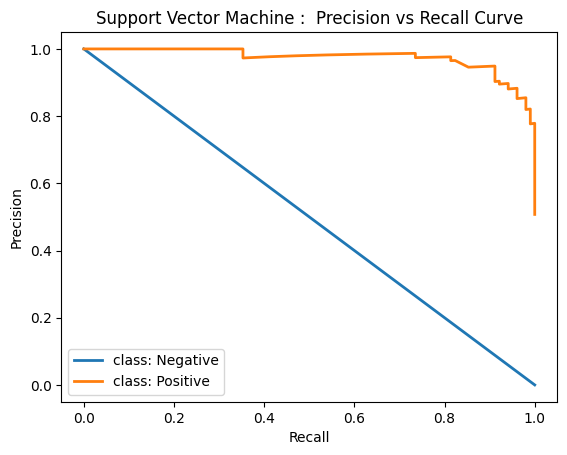

In [52]:
# precision recall curve

from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

#DV_test = DV_test.astype(np.uint8)
n_classes =len(set(DV_test))
DV_test_labelBinary = label_binarize(DV_test, classes=[0,1,2])

print(n_classes)
labels = ["Negative" , "Positive" , "Neutral"]
precision = dict()
recall = dict()
for i in range(n_classes):
    print(i)
    precision[i], recall[i], _ = precision_recall_curve(DV_test_labelBinary[:, i], y_prob[:, i])
    plt.plot(recall[i], precision[i], lw=2, label='class: {}'.format(labels[i]))
    
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc='lower left')
plt.title("Support Vector Machine :  Precision vs Recall Curve")
plt.show()


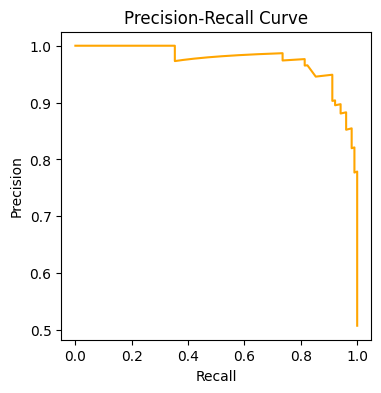

In [53]:
#calculate precision and recall
from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve

precision_svm, recall_svm, thresholds_svm = precision_recall_curve(DV_test, y_prob[:, 1])

#create precision recall curve
fig, ax = plt.subplots(figsize=(4,4))
# ax.plot(recall, precision, color='purple')
ax.plot(recall_svm, precision_svm, color='orange')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#display plot
plt.show()

In [54]:
#import lime
#import lime.lime_text
from lime_text import LimeTextExplainer

# from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=[-1,1])

In [55]:
idx =64
df_train.iloc[idx]

Text     Teehee dear difficulties finding scientific ab...
Label                                                   -1
Name: 98, dtype: object

In [56]:
# idx =0
# exp = explainer.explain_instance(df_train.Text[idx], model.predict_proba, num_features=10)
# #print('True class: %s' % reviews_test.label[idx])
# exp.show_in_notebook(text=True)
# exp

### GaussianNB

In [57]:
# # Create the tf-idf vectorizer
# vectorizer = TfidfVectorizer(strip_accents='ascii')

# # First fit the vectorizer with our training set
# tfidf_train = vectorizer.fit_transform(IV_train)

# # Now we can fit our test data with the same vectorizer
# tfidf_test = vectorizer.transform(IV_test)

# # https://www.kaggle.com/code/barishasdemir/classification-with-naive-bayes

In [58]:
# from sklearn.naive_bayes import GaussianNB

# #TF-IDF
# # Convert x_train to vector
# tfidf_vectorizer = TfidfVectorizer()
# tfidf_train = tfidf_vectorizer.fit_transform(IV_train).toarray()
# tfidf_test = tfidf_vectorizer.transform(IV_test).toarray()

# model=GaussianNB()
# model.fit(tfidf_train, DV_train) 

In [59]:
# #prediction

# y_pred = model.predict(tfidf_test)
# y_prob = model.predict_proba(tfidf_test)[:,1]

In [60]:
# #import lime
# #import lime.lime_text
# from lime_text import LimeTextExplainer

# # from lime.lime_text import LimeTextExplainer
# explainer = LimeTextExplainer(class_names=[-1,1])

In [61]:
# from sklearn.pipeline import make_pipeline

# # Explaining the predictions and important features for predicting the label 1
# c = make_pipeline(tfidf_vectorizer, model)

In [62]:
# idx =0
# explainer = LimeTextExplainer(class_names=[1,-1])
# # classifier_fn is the probability function that takes a string and returns prediction probabilities.
# # num_features is the max. number of features we want in the explanation(default is 10).
# # labels=(1,) means we want the explanation for the label 1
# exp = explainer.explain_instance(IV_test.iloc[idx], c.predict_proba, num_features=10)
# exp.show_in_notebook()

In [63]:
# idx =0
# exp = explainer.explain_instance(df_train1, model.predict_proba, num_features=2)
# #print('True class: %s' % reviews_test.label[idx])
# exp.show_in_notebook(text=True)
# exp

### MultinomialNB

In [64]:
from sklearn.naive_bayes import MultinomialNB

#TF-IDF
# Convert x_train to vector
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
tfidf_train = tfidf_vectorizer.fit_transform(IV_train) 
tfidf_test = tfidf_vectorizer.transform(IV_test)

model=MultinomialNB()
model.fit(tfidf_train, DV_train) 


MultinomialNB()

In [65]:
#prediction

y_pred = model.predict(tfidf_test.todense())
y_prob = model.predict_proba(tfidf_test.todense())#[:,1]

c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


In [66]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

print("Accuracy : ", accuracy_score(y_pred, DV_test))
print("Precision : ", precision_score(y_pred, DV_test, average = 'weighted'))
print("Recall : ", recall_score(y_pred, DV_test, average = 'weighted'))
print("F1 Score : ", recall_score(y_pred, DV_test, average = 'weighted'))

Accuracy :  0.9154228855721394
Precision :  0.9212759730757976
Recall :  0.9154228855721394
F1 Score :  0.9154228855721394


c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


2
0
1


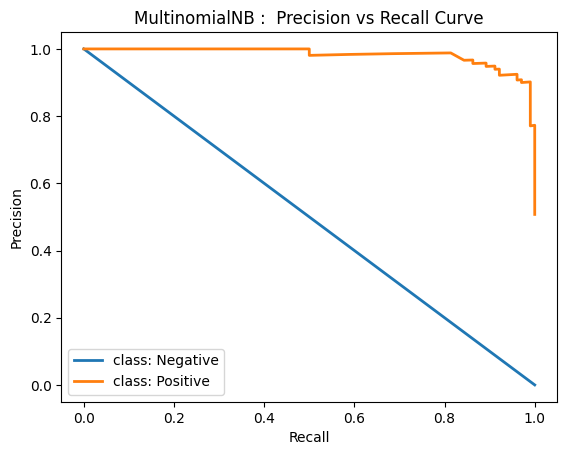

In [67]:
# precision recall curve

from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

#DV_test = DV_test.astype(np.uint8)
n_classes =len(set(DV_test))
DV_test_labelBinary = label_binarize(DV_test, classes=[0,1,2])

print(n_classes)
labels = ["Negative" , "Positive" , "Neutral"]
precision = dict()
recall = dict()
for i in range(n_classes):
    print(i)
    precision[i], recall[i], _ = precision_recall_curve(DV_test_labelBinary[:, i], y_prob[:, i])
    plt.plot(recall[i], precision[i], lw=2, label='class: {}'.format(labels[i]))
    
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc='lower left')
plt.title("MultinomialNB :  Precision vs Recall Curve")
plt.show()

In [68]:
#import lime
#import lime.lime_text
from lime_text import LimeTextExplainer

# from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=[-1,1])

In [69]:
from sklearn.pipeline import make_pipeline

# Explaining the predictions and important features for predicting the label 1
c = make_pipeline(tfidf_vectorizer, model)

In [70]:
idx =0
explainer = LimeTextExplainer(class_names=[1,0,-1])
# classifier_fn is the probability function that takes a string and returns prediction probabilities.
# num_features is the max. number of features we want in the explanation(default is 10).
# labels=(1,) means we want the explanation for the label 1
exp = explainer.explain_instance(IV_test.iloc[15], c.predict_proba, num_features=10)
exp.show_in_notebook()

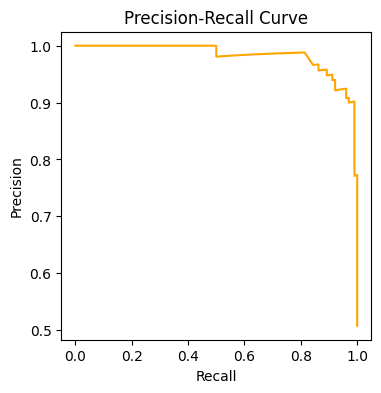

In [71]:
#calculate precision and recall
from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve

precision_multinomialnb, recall_multinomialnb, thresholds_svm = precision_recall_curve(DV_test, y_prob[:, 1])

#create precision recall curve
fig, ax = plt.subplots(figsize=(4,4))
ax.plot(recall_multinomialnb, precision_multinomialnb, color='orange')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#display plot
plt.show()

### KNN

In [72]:
from sklearn.neighbors import KNeighborsClassifier 

#TF-IDF
# Convert x_train to vector
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
tfidf_train = tfidf_vectorizer.fit_transform(IV_train) 
tfidf_test = tfidf_vectorizer.transform(IV_test)

model=KNeighborsClassifier()
model.fit(tfidf_train, DV_train) 

KNeighborsClassifier()

In [73]:
#prediction

y_pred = model.predict(tfidf_test.todense())
y_prob = model.predict_proba(tfidf_test.todense())#[:,1]

c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


In [74]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

print("Accuracy : ", accuracy_score(y_pred, DV_test))
print("Precision : ", precision_score(y_pred, DV_test, average = 'weighted'))
print("Recall : ", recall_score(y_pred, DV_test, average = 'weighted'))
print("F1 Score : ", recall_score(y_pred, DV_test, average = 'weighted'))

Accuracy :  0.900497512437811
Precision :  0.902191360488112
Recall :  0.900497512437811
F1 Score :  0.900497512437811


2
0
1


c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


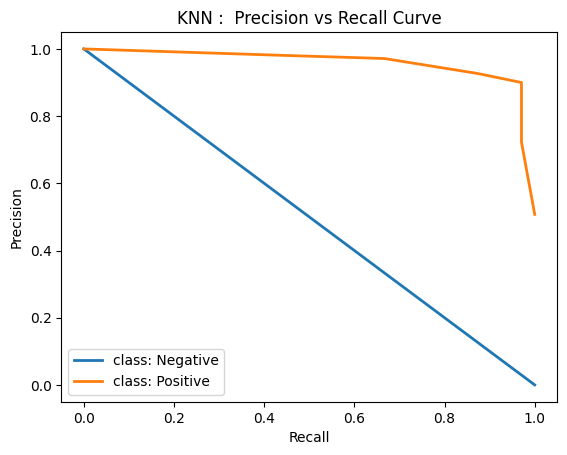

In [75]:
# precision recall curve

from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

#DV_test = DV_test.astype(np.uint8)
n_classes =len(set(DV_test))
DV_test_labelBinary = label_binarize(DV_test, classes=[0,1,2])

print(n_classes)
labels = ["Negative" , "Positive" , "Neutral"]
precision = dict()
recall = dict()
for i in range(n_classes):
    print(i)
    precision[i], recall[i], _ = precision_recall_curve(DV_test_labelBinary[:, i], y_prob[:, i])
    plt.plot(recall[i], precision[i], lw=2, label='class: {}'.format(labels[i]))
    
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc='lower left')
plt.title("KNN :  Precision vs Recall Curve")
plt.show()

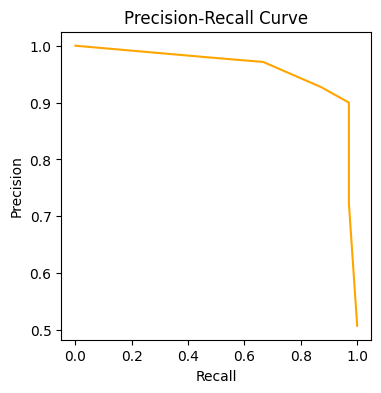

In [76]:
#calculate precision and recall
from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve

precision_knn, recall_knn, thresholds_svm = precision_recall_curve(DV_test, y_prob[:, 1])

#create precision recall curve
fig, ax = plt.subplots(figsize=(4,4))
ax.plot(recall_knn, precision_knn, color='orange')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#display plot
plt.show()

### Decision Tree

In [77]:
from sklearn.tree import DecisionTreeClassifier

#TF-IDF
# Convert x_train to vector
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
tfidf_train = tfidf_vectorizer.fit_transform(IV_train) 
tfidf_test = tfidf_vectorizer.transform(IV_test)

model=DecisionTreeClassifier(random_state = 1)
model.fit(tfidf_train, DV_train) 

DecisionTreeClassifier(random_state=1)

In [78]:
#prediction

y_pred = model.predict(tfidf_test.todense())
y_prob = model.predict_proba(tfidf_test.todense()) #[:,1]

c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


In [79]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

print("Accuracy : ", accuracy_score(y_pred, DV_test))
print("Precision : ", precision_score(y_pred, DV_test, average = 'weighted'))
print("Recall : ", recall_score(y_pred, DV_test, average = 'weighted'))
print("F1 Score : ", recall_score(y_pred, DV_test, average = 'weighted'))

Accuracy :  0.8308457711442786
Precision :  0.8317385147938264
Recall :  0.8308457711442786
F1 Score :  0.8308457711442786


In [80]:
#import lime
#import lime.lime_text
from lime_text import LimeTextExplainer

# from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=[1 ,-1])

In [81]:
from sklearn.pipeline import make_pipeline

# Explaining the predictions and important features for predicting the label 1
c = make_pipeline(tfidf_vectorizer, model)

In [82]:
idx =0

explainer = LimeTextExplainer(class_names=[1,-1])
# classifier_fn is the probability function that takes a string and returns prediction probabilities.
# num_features is the max. number of features we want in the explanation(default is 10).
# labels=(1,) means we want the explanation for the label 1
exp = explainer.explain_instance(IV_test.iloc[15], c.predict_proba, num_features=10)
exp.show_in_notebook()

2
0
1


c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


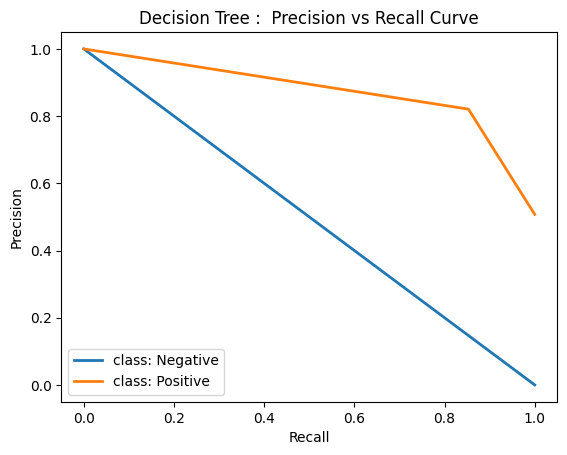

In [83]:
# precision recall curve

from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

#DV_test = DV_test.astype(np.uint8)
n_classes =len(set(DV_test))
DV_test_labelBinary = label_binarize(DV_test, classes=[0,1,2])

print(n_classes)
labels = ["Negative" , "Positive" , "Neutral"]
precision = dict()
recall = dict()
for i in range(n_classes):
    print(i)
    precision[i], recall[i], _ = precision_recall_curve(DV_test_labelBinary[:, i], y_prob[:, i])
    plt.plot(recall[i], precision[i], lw=2, label='class: {}'.format(labels[i]))
    
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc='lower left')
plt.title("Decision Tree :  Precision vs Recall Curve")
plt.show()

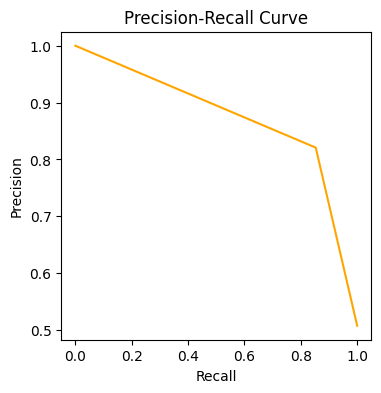

In [84]:
#calculate precision and recall
from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve

precision_decisiontree, recall_decisiontree, thresholds_svm = precision_recall_curve(DV_test, y_prob[:, 1])

#create precision recall curve
fig, ax = plt.subplots(figsize=(4,4))
ax.plot(recall_decisiontree, precision_decisiontree, color='orange')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#display plot
plt.show()

### Random Forest 

In [85]:
# https://www.kdnuggets.com/2022/01/explain-nlp-models-lime.html

from sklearn.ensemble import RandomForestClassifier

#TF-IDF
# Convert x_train to vector
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
tfidf_train = tfidf_vectorizer.fit_transform(IV_train) 
tfidf_test = tfidf_vectorizer.transform(IV_test)

model=RandomForestClassifier(n_estimators = 100, random_state = 10)
model.fit(tfidf_train, DV_train) 

RandomForestClassifier(random_state=10)

In [86]:
#prediction

y_pred = model.predict(tfidf_test.todense())
y_prob = model.predict_proba(tfidf_test.todense())#[:,1]

c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


In [87]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

print("Accuracy : ", accuracy_score(y_pred, DV_test))
print("Precision : ", precision_score(y_pred, DV_test, average = 'weighted'))
print("Recall : ", recall_score(y_pred, DV_test, average = 'weighted'))
print("F1 Score : ", recall_score(y_pred, DV_test, average = 'weighted'))

Accuracy :  0.9054726368159204
Precision :  0.9055081100735183
Recall :  0.9054726368159204
F1 Score :  0.9054726368159204


In [88]:
#import lime
#import lime.lime_text
from lime_text import LimeTextExplainer

# from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=[0,1])

In [89]:
idx =64
df_train.iloc[idx]

Text     Teehee dear difficulties finding scientific ab...
Label                                                   -1
Name: 98, dtype: object

In [90]:
from sklearn.pipeline import make_pipeline

# Explaining the predictions and important features for predicting the label 1
c = make_pipeline(tfidf_vectorizer, model)

In [91]:
c

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('randomforestclassifier',
                 RandomForestClassifier(random_state=10))])

In [92]:
IV_test.iloc[15]

'Sometimes think abbreviations write them'

In [93]:
idx =0

explainer = LimeTextExplainer(class_names=[1,-1])
# classifier_fn is the probability function that takes a string and returns prediction probabilities.
# num_features is the max. number of features we want in the explanation(default is 10).
# labels=(1,) means we want the explanation for the label 1
exp = explainer.explain_instance(IV_test.iloc[15], c.predict_proba, num_features=10)
exp.show_in_notebook()


2
0
1


c:\Users\asif.raza\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


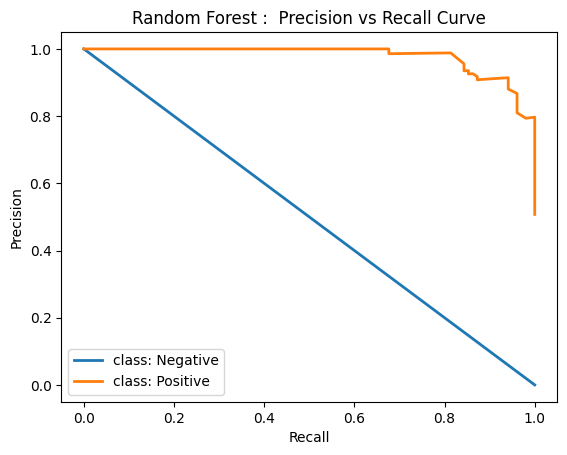

In [94]:
# precision recall curve

from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

#DV_test = DV_test.astype(np.uint8)
n_classes =len(set(DV_test))
DV_test_labelBinary = label_binarize(DV_test, classes=[0,1,2])

print(n_classes)
labels = ["Negative" , "Positive" , "Neutral"]
precision = dict()
recall = dict()
for i in range(n_classes):
    print(i)
    precision[i], recall[i], _ = precision_recall_curve(DV_test_labelBinary[:, i], y_prob[:, i])
    plt.plot(recall[i], precision[i], lw=2, label='class: {}'.format(labels[i]))
    
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc='lower left')
plt.title("Random Forest :  Precision vs Recall Curve")
plt.show()

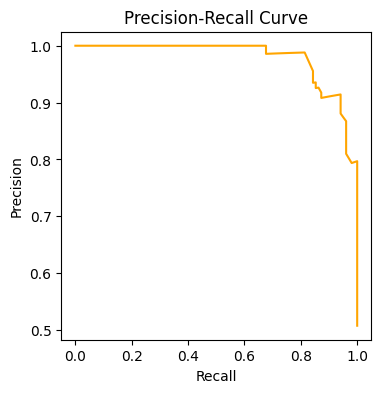

In [95]:
#calculate precision and 

from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve

precision_randomforest, recall_randomforest, thresholds_svm = precision_recall_curve(DV_test, y_prob[:, 1])

#create precision recall curve
fig, ax = plt.subplots(figsize=(4,4))
ax.plot(recall_randomforest, precision_randomforest, color='orange')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#display plot
plt.show()

### XGBoost

In [96]:
# Train an xgboost classifier
from xgboost import XGBClassifier

In [97]:
model = XGBClassifier(
    max_depth=5, learning_rate=0.01, n_estimators=80, gamma=0, 
                        min_child_weight=1, subsample=0.8, colsample_bytree=0.8, reg_alpha=0.005)
    # random_state=42, seed=2, colsample_bytree=0.6, subsample=0.7)

In [98]:
DV_train


0     -1
2      1
3      1
4     -1
6      1
      ..
724   -1
727   -1
728    1
729   -1
730    1
Name: Label, Length: 470, dtype: int64

In [99]:
##


DV_train.replace(1, 0,inplace=True)
DV_train.replace(-1, 1,inplace=True)

DV_test.replace(1, 0,inplace=True)
DV_test.replace(-1, 1,inplace=True)

# data['sex'].replace(1, 'Male',inplace=True)

In [100]:
# Convert x_train to vector
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
tfidf_train = tfidf_vectorizer.fit_transform(IV_train) 
tfidf_test = tfidf_vectorizer.transform(IV_test)

# model=RandomForestClassifier(n_estimators = 100, random_state = 10)
model.fit(tfidf_train, DV_train) 

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.01, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=5, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=80, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [101]:
# Make predictions
#predict_train = model.predict(tfidf_test)

#prediction

y_pred = model.predict(tfidf_test.todense())
y_prob = model.predict_proba(tfidf_test.todense())# [:,1]

In [102]:
y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1])

In [103]:
y_prob

array([[0.31855118, 0.6814488 ],
       [0.31855118, 0.6814488 ],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.3117075 , 0.6882925 ],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.28179693, 0.71820307],
       [0.3117075 , 0.6882925 ],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.28179693, 0.71820307],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.28179693, 0.71820307],
       [0.31831163, 0.68168837],
       [0.31474912, 0.6852509 ],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.28179693, 0.71820307],
       [0.31831163, 0.68168837],
       [0.31831163, 0.68168837],
       [0.

In [104]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

print("Accuracy : ", accuracy_score(y_pred, DV_test))
print("Precision : ", precision_score(y_pred, DV_test))
print("Recall : ", recall_score(y_pred, DV_test))
print("F1 Score : ", recall_score(y_pred, DV_test))

Accuracy :  0.4925373134328358
Precision :  1.0
Recall :  0.4925373134328358
F1 Score :  0.4925373134328358


2
0
1


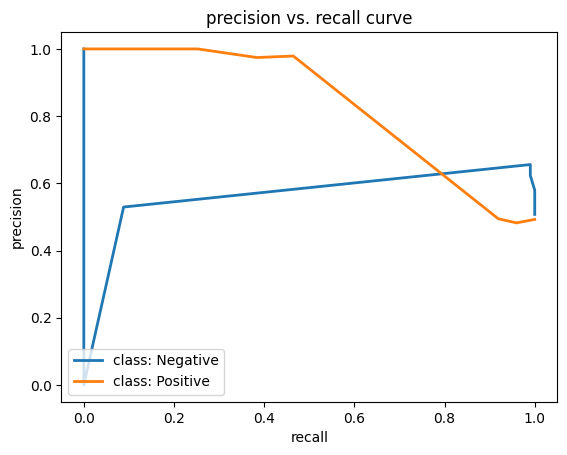

In [105]:
# precision recall curve

from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

#DV_test = DV_test.astype(np.uint8)
n_classes =len(set(DV_test))
DV_test_labelBinary = label_binarize(DV_test, classes=[0,1,2])

print(n_classes)
labels = ["Negative" , "Positive" , "Neutral"]
precision = dict()
recall = dict()
for i in range(n_classes):
    print(i)
    precision[i], recall[i], _ = precision_recall_curve(DV_test_labelBinary[:, i], y_prob[:, i])
    plt.plot(recall[i], precision[i], lw=2, label='class: {}'.format(labels[i]))
    
plt.xlabel("recall")
plt.ylabel("precision")
plt.legend(loc='lower left')
plt.title("precision vs. recall curve")
plt.show()

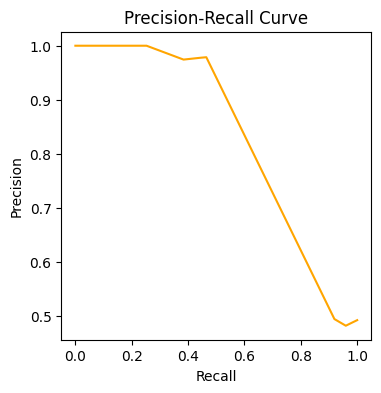

In [106]:
#calculate precision and recall
from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve

precision_xgboost, recall_xgboost, thresholds_xgboost = precision_recall_curve(DV_test, y_prob[:, 1])

#create precision recall curve
fig, ax = plt.subplots(figsize=(4,4))
# ax.plot(recall, precision, color='purple')
ax.plot(recall_xgboost, precision_xgboost, color='orange')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#display plot
plt.show()

In [107]:
# # # Train an xgboost classifier
# from xgboost import XGBClassifier

# # Instantiate our model
# clf = XGBClassifier()

# # Fit the model to the training data
# clf.fit(msg_train, label_train)

# #TF-IDF
# # Convert x_train to vector
# tfidf_vectorizer = TfidfVectorizer(use_idf=True)
# tfidf_train = tfidf_vectorizer.fit_transform(IV_train) 
# tfidf_test = tfidf_vectorizer.transform(IV_test)

# model=RandomForestClassifier(n_estimators = 100, random_state = 10)
# model.fit(tfidf_train, DV_train) 

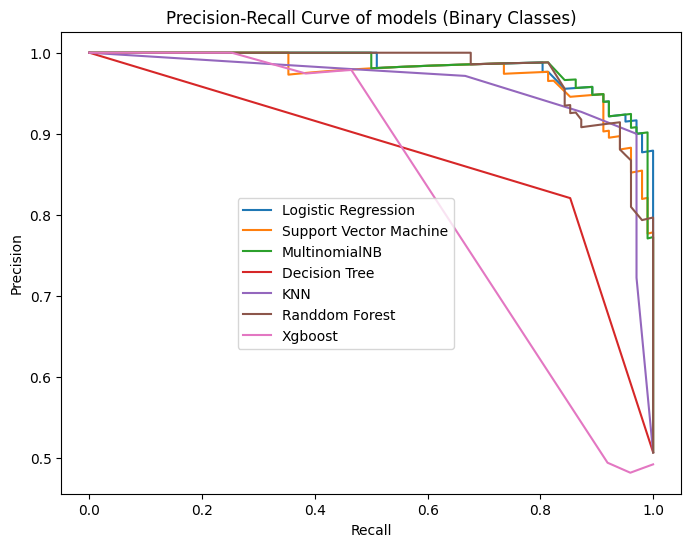

In [108]:
# P R of models

#calculate precision and recall
from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve

#precision_randomforest, recall_randomforest, thresholds_randomforest = precision_recall_curve(DV_test, y_prob[:, 1])

#create precision recall curve
fig, ax = plt.subplots(figsize=(8,6))
# ax.plot(recall, precision, color='purple')
ax.plot(recall_logistic, precision_logistic, label="Logistic Regression")
ax.plot(recall_svm, precision_svm,  label='Support Vector Machine')
ax.plot(recall_multinomialnb, precision_multinomialnb,  label="MultinomialNB")
ax.plot(recall_decisiontree, precision_decisiontree,  label="Decision Tree")
ax.plot(recall_knn, precision_knn,  label="KNN")
ax.plot(recall_randomforest, precision_randomforest,  label="Randdom Forest")
ax.plot(recall_xgboost, precision_xgboost,  label="Xgboost")

#add axis labels to plot
ax.set_title('Precision-Recall Curve of models (Binary Classes)')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')
fig.legend(loc = "center")
#display plot
plt.show()